<h1 style="text-align: center;">Hyperparameter Tuning</h1>
<h3 style="text-align: center;">Hotel Booking Cancellation Prediction</h3>

---

<h5 style="text-align: right;">By Beta Group</h5>

## Pipeline Training Model

## Goal

Notebook ini membangun dan membandingkan dua model klasifikasi, yaitu XGBoost dan Logistic Regression untuk memprediksi apakah suatu reservasi hotel akan **dibatalkan** (is_canceled) berdasarkan data historis reservasi tahun 2017.

## Flow

1. **Persiapan data** : membagi data menjadi data pelatihan dan data pengujian serta mengelompokkan fitur numerik dan kategorikal.
2. **Ruang pencarian hyperparameter** : menentukan berbagai kandidat strategi preprocessing (scaling, encoding, resampling, dan seleksi fitur).
3. **Pelatihan dan tuning** : menjalankan `RandomizedSearchCV` untuk setiap model menggunakan cross-validation.
4. **Diagnosis model** : menggunakan learning curve untuk memeriksa indikasi overfitting atau underfitting.
5. **Perbandingan model** : membandingkan performa antar-model berdasarkan nilai ROC-AUC.
6. **Pemilihan dan penyimpanan model akhir** : memilih serta menyimpan model berdasarkan ambang batas performa dan stabilitasnya.

## Metric Evaluation

ROC-AUC digunakan karena distribusi target (`is_canceled`) berpotensi tidak seimbang. Selain itu, ROC-AUC dapat mengukur kemampuan model dalam membedakan reservasi yang dibatalkan dan tidak dibatalkan tanpa bergantung pada satu threshold klasifikasi tertentu.

In [1]:
import warnings
warnings.filterwarnings("ignore")

# **Section 0. Global Configuration**

Parameter berikut mengatur keseluruhan proses pelatihan model dalam notebook ini:

| Variabel | Fungsi |
|---|---|
| `RANDOM_STATE` | Nilai acak awal untuk memastikan hasil dapat direproduksi secara konsisten |
| `READ_CSV` | Lokasi atau path dataset yang telah dibersihkan |
| `N_ITERS` | Jumlah kombinasi hyperparameter yang diuji secara acak oleh `RandomizedSearchCV` untuk setiap model |
| `ROC_MODEL_THRESHOLDS` | Nilai minimum ROC-AUC validasi yang harus dicapai agar model lolos tahap seleksi |
| `STD_MODEL_THRESHOLDS` | Batas maksimum standar deviasi ROC-AUC validasi agar model dianggap stabil |

In [2]:
RANDOM_STATE=42
READ_CSV = "../data/hotel_booking_2017_cleaned.csv"
OUTPUT_FINAL_MODEL_DIR = "../final_model/"
N_ITERS=2000

ROC_MODEL_THRESHOLDS = 0.7
STD_MODEL_THRESHOLDS = 0.01
GAP_TRAIN_ROC_THRESHOLD = 0.25

### **0.1 Import Library**

Mengimpor seluruh library yang diperlukan, yaitu `pandas` dan `numpy` untuk pengolahan data, `scikit-learn `untuk membangun pipeline dan model, `imbalanced-learn` untuk resampling, `feature-engine` untuk penanganan outlier, `category_encoders` untuk metode encoding kategorikal tingkat lanjut, `xgboost` untuk model boosting, serta `matplotlib` untuk visualisasi.

In [3]:
import os

import pandas as pd
import numpy as np

from sklearn.preprocessing import RobustScaler, OneHotEncoder, MinMaxScaler, StandardScaler, PowerTransformer, FunctionTransformer
from sklearn.model_selection import RandomizedSearchCV, learning_curve, PredefinedSplit
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import (
    SelectKBest,
    f_classif,
    SelectFdr
)
from sklearn.metrics import roc_auc_score, roc_curve, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix

from itertools import combinations

from xgboost import XGBClassifier

from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

from category_encoders import TargetEncoder, CatBoostEncoder, BinaryEncoder

import matplotlib.pyplot as plt

import joblib 

### **0.2 Load Dataset**

Memuat dataset yang dihasilkan dari tahap pembersihan data sebelumnya, yaitu (`hotel_booking_2017_cleaned.csv`).

In [4]:
df = pd.read_csv(READ_CSV)
df.head()

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,...,has_babies,is_family,total_stay_nights,has_agent,has_company,total_previous_bookings,previous_cancellation_rate,has_previous_cancellation,has_booking_changes,room_type_changed
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,...,0,0,0,0,0,0,0.0,0,1,0
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,...,0,0,0,0,0,0,0.0,0,1,0
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,...,0,0,1,0,0,0,0.0,0,0,1
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,...,0,0,1,1,0,0,0.0,0,0,0
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,...,0,0,2,1,0,0,0.0,0,0,0


# **Section 1. Data Preparation**

## **1.1 Initialization**

In [5]:
x = df.drop(columns=["is_canceled"])
y = df["is_canceled"]

## **1.2 Separating Numerical and Categorical Columns**

In [6]:
NUMERIC_COLS = [
    "lead_time",
    "arrival_date_week_number",
    "arrival_date_day_of_month",
    "stays_in_weekend_nights",
    "stays_in_week_nights",
    "adults",
    "children",
    "babies",
    "previous_cancellations",
    "previous_bookings_not_canceled",
    "booking_changes",
    "days_in_waiting_list",
    "adr",
    "required_car_parking_spaces",
    "total_of_special_requests",
]

CATEGORICAL_COLS = [
    "hotel",
    "arrival_date_year",
    "arrival_date_month",
    "meal",
    "country",
    "market_segment",
    "distribution_channel",
    "reserved_room_type",
    "assigned_room_type",
    "deposit_type",
    "customer_type",
    "agent",
    "company",

    "has_children",
    "has_babies",
    "is_family",
    "has_agent",
    "has_company",
    "room_type_changed"
]

## **1.3 Split Dataset Into Train and Test Sets**

Dataset dibagi berdasarkan tahun reservasi. Data tahun 2015 digunakan untuk training, data tahun 2016 digunakan untuk validation, dan data tahun 2017 digunakan untuk testing. Pembagian ini mengikuti urutan waktu pada data, sehingga model mempelajari pola dari periode sebelumnya dan dievaluasi pada periode setelahnya.

Data training digunakan untuk membangun model, sedangkan data validasi digunakan untuk membandingkan dan memilih model terbaik. Data tahun 2017 disimpan secara terpisah dan hanya digunakan pada tahap akhir untuk mengukur kemampuan model terpilih dalam memprediksi data baru.

In [7]:
train_df = df[df["arrival_date_year"] == 2015].copy()
val_df   = df[df["arrival_date_year"] == 2016].copy()
test_df  = df[df["arrival_date_year"] == 2017].copy()

x_train = train_df.drop(columns=["is_canceled"])
y_train = train_df["is_canceled"]

x_val = val_df.drop(columns=["is_canceled"])
y_val = val_df["is_canceled"]

x_test = test_df.drop(columns=["is_canceled"])
y_test = test_df["is_canceled"]

print(f"Train      : {len(train_df):,}")
print(f"Validation : {len(val_df):,}")
print(f"Test       : {len(test_df):,}")

Train      : 21,965
Validation : 56,621
Test       : 40,619


## **1.4 Establishing Temporal Cross-Validation**

Untuk proses tuning model, data tahun 2015 dan 2016 digabungkan menjadi satu dataset. Selanjutnya, dibuat pembagian cross-validation khusus agar data tahun 2015 selalu digunakan sebagai data pelatihan dan data tahun 2016 selalu digunakan sebagai data validasi. Pendekatan ini mempertahankan urutan waktu sekaligus mencegah model menggunakan data tahun 2016 selama proses pelatihan.

>> **PredefinedSplit** memungkinkan kita menentukan secara langsung data yang digunakan untuk pelatihan dan validasi. Dalam kasus ini, data tahun 2015 selalu digunakan untuk training dan data tahun 2016 selalu digunakan untuk validation. Berbeda dengan **StratifiedKFold**, data tidak dibagi secara acak ke dalam beberapa fold. Metode ini digunakan karena urutan waktu antara data tahun 2015 dan 2016 perlu dipertahankan.

>> Pada **StratifiedKFold**, data dapat dibagi menjadi fold 1, fold 2, fold 3, dan seterusnya. Bagian data yang digunakan untuk training dan validation akan berganti pada setiap fold. Sementara itu, pada **PredefinedSplit**, pembagian data ditentukan sendiri melalui `test_fold`: nilai -1 menunjukkan bahwa baris selalu menjadi bagian dari data pelatihan, sedangkan nilai 0 menunjukkan bahwa baris menjadi bagian dari data validasi. Dengan demikian, model dalam kasus ini selalu dilatih menggunakan data tahun 2015 dan divalidasi menggunakan data tahun 2016.

In [8]:
search_df = pd.concat(
    [train_df, val_df],
    axis=0
).reset_index(drop=True)

x_search = search_df.drop(columns=["is_canceled"])
y_search = search_df["is_canceled"]

# -1 = selalu masuk training
#  0 = validation fold
test_fold = np.where(
    search_df["arrival_date_year"] == 2016,
    0,
    -1
)

temporal_cv = PredefinedSplit(
    test_fold=test_fold
)

print("CV split:")
print(f"Training samples   : {(test_fold == -1).sum():,}")
print(f"Validation samples : {(test_fold == 0).sum():,}")

CV split:
Training samples   : 21,965
Validation samples : 56,621


## **1.5 Identifying Low Variance Numerical Columns**

Kolom numerik yang memiliki kurang dari 10 nilai unik, seperti kolom biner atau penanda (flag), diperlakukan berbeda dari kolom numerik kontinu.

Kolom-kolom tersebut dipisahkan ke dalam `LOW_VARIANCE_NUMERIC_COLS` agar tidak melalui tahapan penanganan outlier atau transformasi distribusi yang kurang relevan untuk jenis data tersebut.

In [9]:
LOW_VARIANCE_NUMERIC_COLS = [
    col for col in NUMERIC_COLS
    if x_train[col].nunique() < 10
]

NUMERIC_COLS = [
    col for col in NUMERIC_COLS
    if col not in LOW_VARIANCE_NUMERIC_COLS
]

## **1.6 Categorical Columns Splitting**

Fungsi `create_categorical_splits` membagi kolom kategorikal menjadi dua kelompok kandidat berdasarkan batas jumlah nilai unik yang ditentukan:

**Kardinalitas rendah**, yang akan diproses menggunakan one-hot encoding.
**Kardinalitas tinggi**, yang akan diproses menggunakan target encoding.

In [10]:
def create_categorical_splits(threshold):
    low_cardinality_cols = [
        col
        for col in CATEGORICAL_COLS
        if x_train[col].nunique(dropna=True) <= threshold
    ]

    high_cardinality_cols = [
        col
        for col in CATEGORICAL_COLS
        if x_train[col].nunique(dropna=True) > threshold
    ]

    splits = []

    for r in range(len(high_cardinality_cols) + 1):

        for high_encoder_cols in combinations(high_cardinality_cols, r):

            high_encoder_cols = list(high_encoder_cols)

            ohe_cols = (
                low_cardinality_cols
                + [
                    col
                    for col in high_cardinality_cols
                    if col not in high_encoder_cols
                ]
            )

            splits.append({
                "threshold": threshold,
                "normal_cols": ohe_cols,
                "high_cardinality_cols": high_encoder_cols
            })

    return splits


## **1.7 Numerical Columns Splitting**

Fungsi `create_numerical_splits` membagi kolom numerik menjadi dua kelompok kandidat berdasarkan batas nilai skewness yang ditentukan:

**Kolom normal**, yang diproses menggunakan penanganan outlier.
**Kolom skewed**, yang diproses menggunakan power transformation.


In [11]:
def create_numerical_splits(skew_threshold=1):
    normal_cols = [
        col
        for col in NUMERIC_COLS
        if abs(x_train[col].skew()) <= skew_threshold
    ]

    skewed_cols = [
        col
        for col in NUMERIC_COLS
        if abs(x_train[col].skew()) > skew_threshold
    ]

    splits = []

    for r in range(len(skewed_cols) + 1):

        for skewed_pipeline_cols in combinations(skewed_cols, r):

            skewed_pipeline_cols = list(skewed_pipeline_cols)

            normal_pipeline_cols = (
                normal_cols
                + [
                    col
                    for col in skewed_cols
                    if col not in skewed_pipeline_cols
                ]
            )

            splits.append({
                "skew_threshold": skew_threshold,
                "normal_cols": normal_pipeline_cols,
                "skewed_cols": skewed_pipeline_cols
            })

    return splits

## **1.8 Classification of Numerical Features**

Fitur numerik diklasifikasikan sebagai **normal** atau **skewed** berdasarkan nilai absolut skewness:

Normal: `|skewness| ≤ 5`
Skewed: `|skewness| > 5`

Selanjutnya, seluruh kemungkinan kombinasi fitur skewed dibuat untuk mengevaluasi beberapa alternatif strategi preprocessing.

Contoh: Jika terdapat fitur numerik `Age (0,8)`, `Income (2,1)`, `Balance (6,5)`, dan `Debt (8,2)`, maka `Age` dan `Income` diklasifikasikan sebagai fitur **normal**, sedangkan `Balance` dan `Debt` diklasifikasikan sebagai fitur **skewed**.

Fungsi tersebut kemudian menghasilkan beberapa kemungkinan pembagian, seperti `[]`, `[Balance]`, `[Debt]`, dan `[Balance, Debt]`. Fitur yang tidak dimasukkan ke kelompok skewed akan diperlakukan sebagai `normal_cols`.


In [12]:
SKEW_THRESHOLDS = [5]

numerical_splits = []

for threshold in SKEW_THRESHOLDS:
    numerical_splits.extend(
        create_numerical_splits(threshold)
    )

## **1.9 Classification of Categorical Features**
Fitur kategorikal dibagi berdasarkan **kardinalitas**, yaitu jumlah kategori unik yang dimiliki oleh setiap fitur:

- **Kardinalitas rendah**: `jumlah nilai unik ≤ 10`
- **Kardinalitas tinggi**: `jumlah nilai unik > 10`

Beberapa batas kardinalitas digunakan untuk menghasilkan kandidat pembagian fitur dan strategi preprocessing yang berbeda.

Contoh: Jika terdapat fitur `Gender (2)`, `Education (5)`, `City (20)`, dan `Occupation (15)`, maka `Gender` dan `Education` diklasifikasikan sebagai fitur dengan **kardinalitas rendah**, sedangkan `City` dan `Occupation` diklasifikasikan sebagai fitur dengan **kardinalitas tinggi**. Kedua kelompok tersebut kemudian digunakan untuk membentuk beberapa alternatif preprocessing.


In [13]:
categorical_splits = []
CARDINALITY_THRESHOLDS = [10]

for threshold in CARDINALITY_THRESHOLDS:
    categorical_splits.extend(
        create_categorical_splits(threshold)
    )

## **1.10 Identifying Reusable Preprocessing Components**

Lima objek `Pipeline` berukuran kecil dibuat untuk menangani setiap kelompok kolom:

- Fitur numerik normal.
- Fitur numerik skewed.
- Fitur numerik dengan variasi rendah.
- Fitur kategorikal berkardinalitas rendah menggunakan one-hot encoding.
- Fitur kategorikal berkardinalitas tinggi menggunakan target encoding.

In [14]:
normal_numeric_pipeline = Pipeline([
    ("scaler", RobustScaler())
])

skewed_numeric_pipeline = Pipeline([
    ("transform", PowerTransformer()),
    ("scaler", RobustScaler())
])

low_variance_numeric_pipeline = Pipeline([
    ("scaler", RobustScaler())
])

categorical_ohe_pipeline = Pipeline([
    ("encoder", OneHotEncoder(handle_unknown="ignore", sparse_output=False, drop="first"))
])

categorical_high_cardinal_pipeline = Pipeline([
    ("encoder", TargetEncoder())
])

## **1.11 Creating Baseline Preprocessor**

Komponen preprocessing sebelumnya digabungkan menjadi satu baseline `ColumnTransformer` dengan menggunakan seluruh daftar `NUMERIC_COLS` dan `CATEGORICAL_COLS`, bukan pembagian fitur tertentu. Baseline preprocessor ini berfungsi sebagai struktur awal atau referensi. 

In [15]:
preprocessor = ColumnTransformer(
    [
        ("normal_numeric_pipeline", normal_numeric_pipeline, NUMERIC_COLS),
        ("skewed_numeric_pipeline", skewed_numeric_pipeline, NUMERIC_COLS),
        ("low_variance_numeric_pipeline", low_variance_numeric_pipeline, LOW_VARIANCE_NUMERIC_COLS),
        ("categorical_ohe_pipeline", categorical_ohe_pipeline, CATEGORICAL_COLS),
        ("categorical_high_cardinal_pipeline", categorical_high_cardinal_pipeline, CATEGORICAL_COLS),
    ],
    remainder="drop"
)

## **1.12 Creating Baseline Modeling Pipeline**

Baseline preprocessor digabungkan dengan tahapan feature selection dan resampling yang sementara diatur sebagai (`"passthrough"`), serta classifier default berupa `LogisticRegression`. Kombinasi tersebut membentuk struktur pipeline pemodelan secara keseluruhan.

Struktur yang sama digunakan untuk setiap model. Komponen `classifier` akan diganti sesuai model yang sedang diuji, sedangkan tahapan lainnya akan disesuaikan berdasarkan kombinasi yang dipilih oleh `RandomizedSearchCV` selama proses tuning.

In [16]:
pipeline = Pipeline(
    [
        ("preprocessor", preprocessor),
        ("feature_selection", "passthrough"),
        ("sampler", "passthrough"),
        ("classifier", LogisticRegression())
    ]
)

## **1.13 Selecting Model Candidates**

Dua model yang dibandingkan dalam notebook ini adalah **Logistic Regression** dan **XGBoost**. Keduanya dipilih berdasarkan perbandingan model baseline sebelumnya dengan menggunakan hyperparameter default karena memperoleh performa terbaik di antara model-model yang diuji.

Oleh karena itu, hanya kedua model tersebut yang dilanjutkan ke proses pencarian hyperparameter secara menyeluruh, sehingga seluruh kandidat model tidak perlu diuji ulang dari awal.

In [17]:
xgb = XGBClassifier(random_state=RANDOM_STATE)
logreg = LogisticRegression(random_state=RANDOM_STATE)

## **1.14 Compiling the Entire Candidate Preprocessing Pipeline**

Setiap kombinasi pembagian fitur kategorikal dan numerik yang telah dihasilkan sebelumnya disusun menjadi sebuah `ColumnTransformer` lengkap. Setiap `ColumnTransformer` mewakili satu alternatif strategi rekayasa fitur yang kemudian digunakan sebagai pilihan hyperparameter `preprocessor`. Dengan demikian, `RandomizedSearchCV` dapat memilih strategi preprocessing terbaik.

In [18]:
preprocessors = []

for categorical_split in categorical_splits:
    for numerical_split in numerical_splits:
        preprocessor = ColumnTransformer(
            transformers=[
                (
                    "normal_numeric_pipeline",
                    normal_numeric_pipeline,
                    numerical_split["normal_cols"]
                ),

                (
                    "skewed_numeric_pipeline",
                    skewed_numeric_pipeline,
                    numerical_split["skewed_cols"]
                ),
                (
                    "low_variance_numeric_pipeline",
                    low_variance_numeric_pipeline,
                    LOW_VARIANCE_NUMERIC_COLS
                ),

                (
                    "categorical_ohe_pipeline",
                    categorical_ohe_pipeline,
                    categorical_split["normal_cols"]
                ),

                (
                    "categorical_high_cardinal_pipeline",
                    categorical_high_cardinal_pipeline,
                    categorical_split["high_cardinality_cols"]
                )
            ],
            remainder="drop"
        )

        preprocessors.append(preprocessor)

# **Section 2. Defining the Hyperparameter Search Space**

Bagian ini menentukan seluruh kandidat nilai yang dapat dipilih oleh `RandomizedSearchCV` selama proses tuning. Ruang pencarian mencakup strategi resampling, penanganan outlier, scaling, imputasi, encoding, seleksi fitur, serta hyperparameter khusus untuk setiap model.

## **2.1 Resampling Strategies**

Menentukan cara menangani ketidakseimbangan kelas pada `is_canceled` sebelum pelatihan model, yaitu tanpa resampling, random oversampling, random undersampling, atau SMOTE.

In [19]:
samplers = [
    "passthrough",
    RandomOverSampler(random_state=RANDOM_STATE),
    RandomUnderSampler(random_state=RANDOM_STATE),
    SMOTE(random_state=RANDOM_STATE)
]

## **2.2 Scaling Strategies**

Kandidat scaler yang dievaluasi untuk pipeline numerik meliputi tanpa scaling, `RobustScaler`, `StandardScaler`, dan `MinMaxScaler`.

In [20]:
scalers = [
    "passthrough",
    RobustScaler(),
    StandardScaler(),
    MinMaxScaler()
]

## **2.3 Numerical Data Transformation Strategies**

Kandidat transformasi yang diterapkan pada kolom numerik dengan distribusi miring untuk mengurangi skewness sebelum scaling meliputi tanpa transformasi, power transformation Yeo–Johnson, atau `log1p`.

In [21]:
numerical_log_transfomers = [
    "passthrough",
    PowerTransformer(method='yeo-johnson'),
    FunctionTransformer(
        np.log1p,
        feature_names_out="one-to-one"
    )
]

## **2.4 High Cardinality Features Encoding Strategies**

Kandidat encoder untuk kolom kategorikal berkardinalitas tinggi, seperti `agent` dan `company`, meliputi target encoding, CatBoost encoding, atau binary encoding.

In [22]:
categorical_high_cardinal_encoders = [
    TargetEncoder(),
    CatBoostEncoder(random_state=RANDOM_STATE),
    BinaryEncoder(),
]

## **2.5 Feature Selection Strategies**

Kandidat metode seleksi fitur yang diterapkan setelah preprocessing meliputi tanpa seleksi, `SelectKBest` dengan k=10/15, atau `SelectFdr` dengan alpha=0,05/0,04.

In [23]:
feature_selections = [
    "passthrough",
    SelectKBest(f_classif, k=10),
    SelectKBest(f_classif, k=15),
    SelectFdr(
        score_func=f_classif,
        alpha=0.05
    ),
    SelectFdr(
        score_func=f_classif,
        alpha=0.04
    )
]

## **2.6 Determination of Model and Grid Parameters**

`models_params` menggabungkan setiap kandidat estimator, yaitu Logistic Regression dan XGBoost, dengan `param_grid` masing-masing. Setiap grid mengombinasikan pilihan preprocessing yang telah ditentukan sebelumnya dengan hyperparameter khusus model, seperti `max_depth`, `learning_rate`, dan `subsample`. Komentar pada kode menjelaskan trade-off bias dan variance dari setiap parameter.

In [24]:
models_params = {
    "XGBoost": {
        "model": xgb,
        "param_grid": {
            "sampler": samplers,

            # n_estimators -> default 100
            # - Number of boosting trees built sequentially.
            #
            # higher n_estimators
            # → more boosting stages
            # → can learn more complex patterns
            # → can increase overfitting if too many trees are used
            #
            # lower n_estimators
            # → fewer boosting stages
            # → simpler model
            # → may underfit
            #
            # A moderate range is used because the model is currently
            # showing a large train-validation gap.
            "classifier__n_estimators": [100, 200, 300, 400, 500],

            # learning_rate -> default 0.3 for XGBClassifier
            # - Controls how strongly each new tree contributes to the model.
            #
            # higher learning_rate
            # → faster learning
            # → each tree has a stronger effect
            # → higher risk of overfitting
            #
            # lower learning_rate
            # → slower learning
            # → each tree has a smaller effect
            # → can improve generalization
            # → usually needs more trees
            "classifier__learning_rate": [
                0.02, 0.03, 0.05, 0.08, 0.1
            ],

            # max_depth -> default 6
            # - Maximum depth of each boosting tree.
            #
            # higher max_depth
            # → deeper trees
            # → more complex patterns
            # → higher variance
            # → higher overfitting risk
            #
            # lower max_depth
            # → shallower trees
            # → simpler patterns
            # → lower variance
            # → can reduce overfitting
            #
            # Lower values are prioritized because the current model
            # shows a large train-validation gap.
            "classifier__max_depth": [2, 3, 4],

            # min_child_weight -> default 1
            # - Minimum sum of instance weights required in a child node
            #   for a split to be allowed.
            #
            # higher min_child_weight
            # → requires more evidence before creating a split
            # → fewer unnecessary splits
            # → simpler trees
            # → can reduce overfitting
            #
            # lower min_child_weight
            # → easier to create splits
            # → more complex trees
            # → higher overfitting risk
            "classifier__min_child_weight": [
                5, 10, 15, 20
            ],

            # subsample -> default 1.0
            # - Fraction of training observations used for each tree.
            #
            # higher subsample
            # → each tree sees more observations
            # → less randomness
            # → potentially stronger fit
            # → higher overfitting risk
            #
            # lower subsample
            # → each tree sees fewer observations
            # → more randomness
            # → can reduce overfitting
            # → too low can cause underfitting
            "classifier__subsample": [
                0.5, 0.6, 0.7, 0.8
            ],

            # colsample_bytree -> default 1.0
            # - Fraction of features used for each tree.
            #
            # higher colsample_bytree
            # → more features available to each tree
            # → stronger fit
            # → potentially higher overfitting risk
            #
            # lower colsample_bytree
            # → fewer features used by each tree
            # → more randomness
            # → can reduce overfitting
            # → too low can remove useful information
            "classifier__colsample_bytree": [
                0.5, 0.6, 0.7, 0.8
            ],

            # reg_alpha -> default 0
            # - L1 regularization applied to the model.
            #
            # higher reg_alpha
            # → stronger regularization
            # → reduces the effect of less useful features
            # → can make the model simpler
            # → can reduce overfitting
            #
            # lower reg_alpha
            # → weaker regularization
            # → model can fit the training data more closely
            "classifier__reg_alpha": [
                0.1, 0.5, 1, 2, 5
            ],

            # reg_lambda -> default 1
            # - L2 regularization applied to the model.
            #
            # higher reg_lambda
            # → stronger regularization
            # → discourages overly complex model weights
            # → can reduce overfitting
            #
            # lower reg_lambda
            # → weaker regularization
            # → model has more freedom to fit the training data
            "classifier__reg_lambda": [
                1, 2, 5, 10, 20
            ],

            # scale_pos_weight -> default 1
            # - Controls the relative weight of the positive class.
            #
            # higher scale_pos_weight
            # → gives more importance to cancellation cases
            # → can improve sensitivity to the positive class
            # → may affect precision and recall
            #
            # This parameter is included to account for class imbalance.
            # It is not primarily used to control overfitting.
            "classifier__scale_pos_weight": [
                1.0, 1.2, 1.5, 1.7
            ],

            "preprocessor": preprocessors,

            "feature_selection": feature_selections,

            "preprocessor__normal_numeric_pipeline__scaler": scalers,
            "preprocessor__skewed_numeric_pipeline__scaler": scalers,
            "preprocessor__low_variance_numeric_pipeline__scaler": scalers,

            "preprocessor__categorical_high_cardinal_pipeline__encoder": categorical_high_cardinal_encoders,

            "preprocessor__skewed_numeric_pipeline__transform": numerical_log_transfomers
        }
    },
    "LogisticRegression": {
        "model": logreg,
        "param_grid": {
            "sampler": samplers,

            # C -> default 1.0
            # - Controls the strength of regularization.
            #
            # lower C
            # → stronger regularization
            # → simpler model
            # → can reduce overfitting
            #
            # higher C
            # → weaker regularization
            # → model can fit training data more closely
            # → higher risk of overfitting
            #
            # Because the Logistic Regression model is currently
            # showing a large train-validation gap, lower C values
            # are included to test stronger regularization.
            "classifier__C": [0.001, 0.01, 0.1, 1.0, 10.0],
            
            # penalty -> default "l2"
            # - Defines the type of regularization applied to the model.
            #
            # l1
            # → can shrink some coefficients to zero
            # → can remove less useful features
            # → can produce a simpler model
            #
            # l2
            # → shrinks coefficients toward zero
            # → keeps most features in the model
            # → commonly used for Logistic Regression
            "classifier__penalty": [None, "l1", "l2"],
            
            # class_weight -> default None
            # - Controls the weight given to each target class.
            #
            # None
            # → all classes receive equal weight
            #
            # balanced
            # → automatically gives more weight to the minority class
            # → can help when the target classes are imbalanced
            # → may improve the model"s ability to identify the minority class
            #
            # This is included because the cancellation target is imbalanced.
            "classifier__class_weight": [None, "balanced"],
            
            # max_iter -> default 100
            # - Maximum number of iterations allowed for the solver.
            #
            # lower max_iter
            # → faster training
            # → may stop before the model converges
            #
            # higher max_iter
            # → gives the solver more time to converge
            # → increases training time
            #
            # This is mainly tuned to make sure the model has enough
            # iterations to reach convergence.
            "classifier__max_iter": [500, 1000, 2000, 3000],

            "preprocessor": preprocessors,

            "feature_selection": feature_selections,

            "preprocessor__normal_numeric_pipeline__scaler": scalers,
            "preprocessor__skewed_numeric_pipeline__scaler": scalers,
            "preprocessor__low_variance_numeric_pipeline__scaler": scalers,

            "preprocessor__categorical_high_cardinal_pipeline__encoder": categorical_high_cardinal_encoders,

            "preprocessor__skewed_numeric_pipeline__transform": numerical_log_transfomers
        }
    }
}

# **Section 3. Model Training and Hyperparameter Search**

Untuk setiap kandidat model, `RandomizedSearchCV` mengambil sebanyak `N_ITERS` kombinasi hyperparameter dari `param_grid`, lalu mengevaluasinya menggunakan temporal cross-validation dengan metrik `roc_auc`. Hasilnya disimpan kembali ke dalam `models_params` untuk dibandingkan.

> `RandomizedSearchCV` digunakan untuk mencari konfigurasi model terbaik dari rentang parameter yang telah ditentukan. Dengan `PredefinedSplit`, model dilatih menggunakan **data tahun 2015**, lalu performanya diperiksa menggunakan **data tahun 2016**. Proses ini diulang untuk berbagai kombinasi parameter yang dipilih secara acak. Skor ROC-AUC tahun 2016 digunakan untuk membandingkan kombinasi, kemudian kombinasi dengan skor tertinggi dipilih sebagai konfigurasi terbaik.

> **Data tahun 2015 digunakan untuk pelatihan dan data tahun 2016 digunakan untuk validasi**. ROC-AUC pelatihan menunjukkan performa model pada data yang dipelajarinya, sedangkan ROC-AUC validasi menunjukkan kemampuan model pada data baru. Perbandingan kedua skor tersebut juga membantu mengidentifikasi indikasi overfitting.

In [25]:
def bootstrap_auc_scores(estimator, X, y, n_bootstraps=1000, random_state=RANDOM_STATE):
    rng = np.random.RandomState(random_state)
    proba = estimator.predict_proba(X)[:, 1]
    y_arr = np.asarray(y)
    n = len(y_arr)

    scores = []
    for _ in range(n_bootstraps):
        idx = rng.randint(0, n, n)           
        if len(np.unique(y_arr[idx])) < 2:
            continue                            
        scores.append(roc_auc_score(y_arr[idx], proba[idx]))

    return np.array(scores)

for model_name, model_params in models_params.items():

    print(model_name)

    model = model_params["model"]
    param_distributions = model_params["param_grid"]

    pipeline = pipeline.set_params(classifier=model)

    random_search = RandomizedSearchCV(
        estimator=pipeline,
        param_distributions=param_distributions,
        n_iter=N_ITERS,
        cv=temporal_cv,
        scoring="roc_auc",
        n_jobs=-1,
        random_state=RANDOM_STATE,
        verbose=2,
        refit=True
    )

    random_search.fit(x_search, y_search)
    best_estimator = random_search.best_estimator_

    train_boot = bootstrap_auc_scores(best_estimator, x_train, y_train)
    val_boot   = bootstrap_auc_scores(best_estimator, x_val, y_val)

    model_params["best_estimator"] = best_estimator
    model_params["best_params"] = random_search.best_params_
    model_params["best_score"] = random_search.best_score_

    model_params["mean_roc_train_score"] = train_boot.mean()
    model_params["sd_roc_train_score"]   = train_boot.std()
    model_params["mean_roc_validate_score"] = val_boot.mean()
    model_params["sd_roc_validate_score"]   = val_boot.std()

XGBoost
Fitting 1 folds for each of 2000 candidates, totalling 2000 fits
[CV] END classifier__colsample_bytree=0.5, classifier__learning_rate=0.08, classifier__max_depth=2, classifier__min_child_weight=15, classifier__n_estimators=500, classifier__reg_alpha=0.5, classifier__reg_lambda=20, classifier__scale_pos_weight=1.5, classifier__subsample=0.7, feature_selection=SelectKBest(k=15), preprocessor=ColumnTransformer(transformers=[('normal_numeric_pipeline',
                                 Pipeline(steps=[('scaler', RobustScaler())]),
                                 ['lead_time', 'arrival_date_week_number',
                                  'arrival_date_day_of_month',
                                  'stays_in_weekend_nights',
                                  'stays_in_week_nights', 'adr',
                                  'booking_changes']),
                                ('skewed_numeric_pipeline',
                                 Pipeline(steps=[('transform',
                  

# **Section 4. Learning Curve Diagnosis**

Untuk estimator terbaik dari setiap model, learning curve divisualisasikan menggunakan ukuran data pelatihan yang meningkat dari 20% hingga 100%. Selisih antara kurva pelatihan dan validasi menunjukkan apakah model mengalami overfitting, yang ditandai oleh selisih besar dan persisten, atau telah mencapai konvergensi, yang ditandai oleh kedua kurva yang mendekat atau mulai stabil.

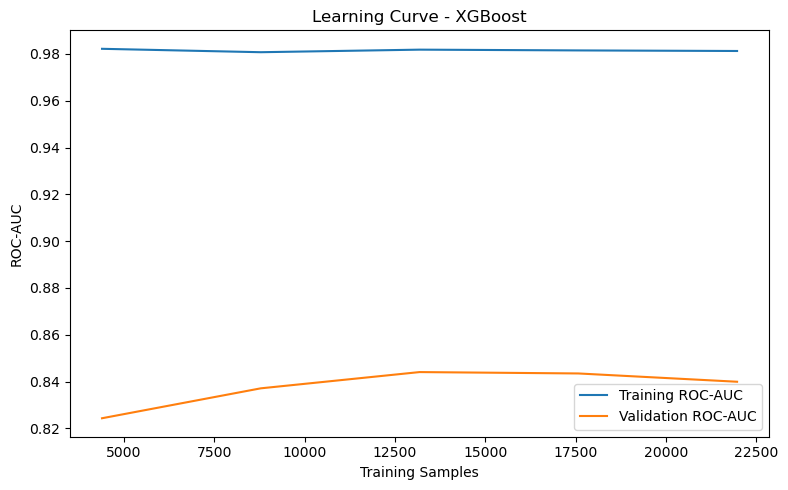

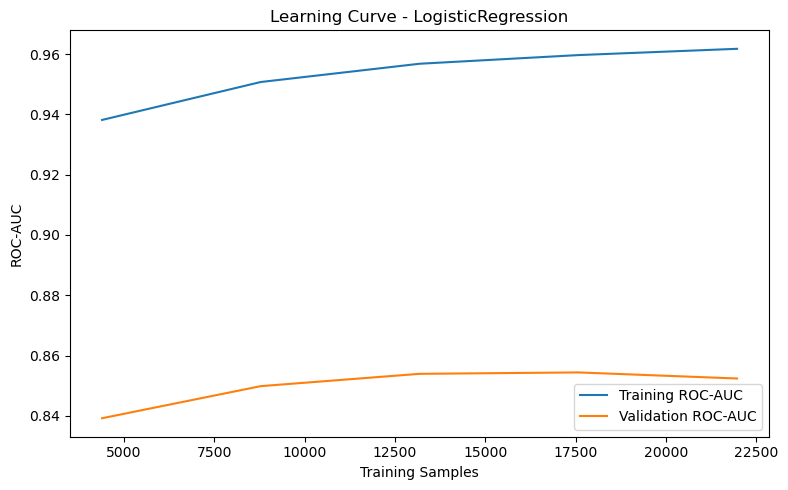

In [26]:
for model_name, model in models_params.items():

    train_sizes, train_scores, valid_scores = learning_curve(
        estimator=model["best_estimator"],
        X=x_search,
        y=y_search,
        cv=temporal_cv,
        scoring="roc_auc",
        train_sizes=np.linspace(0.2, 1.0, 5),
        shuffle=True,
        random_state=RANDOM_STATE,
        n_jobs=-1
    )

    train_mean = train_scores.mean(axis=1)
    train_std = train_scores.std(axis=1)

    valid_mean = valid_scores.mean(axis=1)
    valid_std = valid_scores.std(axis=1)

    plt.figure(figsize=(8, 5))

    plt.plot(
        train_sizes,
        train_mean,
        label="Training ROC-AUC"
    )

    plt.plot(
        train_sizes,
        valid_mean,
        label="Validation ROC-AUC"
    )

    plt.fill_between(
        train_sizes,
        train_mean - train_std,
        train_mean + train_std,
        alpha=0.2
    )

    plt.fill_between(
        train_sizes,
        valid_mean - valid_std,
        valid_mean + valid_std,
        alpha=0.2
    )

    plt.xlabel("Training Samples")
    plt.ylabel("ROC-AUC")
    plt.title(f"Learning Curve - {model_name}")
    plt.legend()

    plt.tight_layout()
    plt.show()

# **Section 5. Cross-Model Comparison of ROC-AUC**

Probabilitas prediksi pada data validasi dihasilkan menggunakan estimator terbaik dari setiap model, kemudian divisualisasikan dalam bentuk kurva ROC bersama garis diagonal sebagai baseline acak. Visualisasi ini memungkinkan perbandingan langsung kemampuan diskriminasi Logistic Regression dan XGBoost.

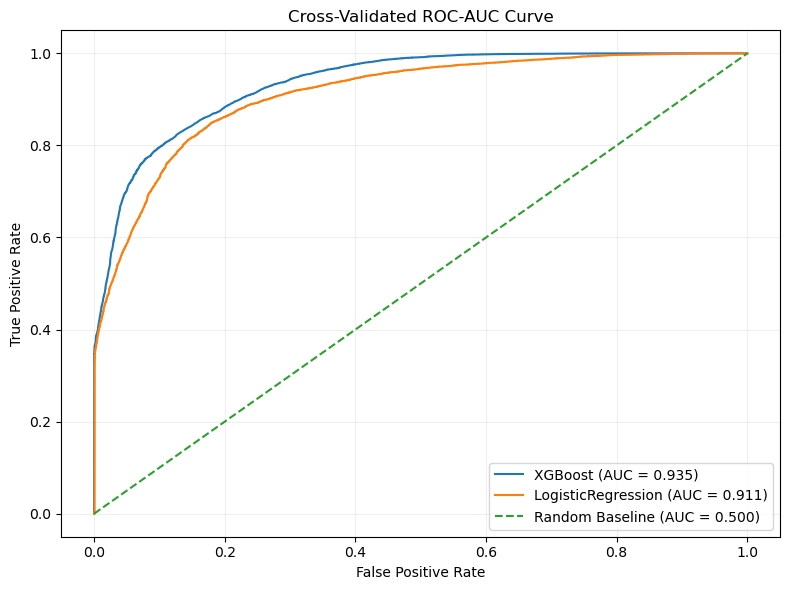

In [27]:
plt.figure(figsize=(8, 6))

for model_name, model in models_params.items():

    val_pred_proba = model["best_estimator"].predict_proba(x_val)[:, 1]


    fpr, tpr, _ = roc_curve(
        y_val,
        val_pred_proba
    )

    # ROC-AUC
    roc_auc = roc_auc_score(
        y_val,
        val_pred_proba
    )

    plt.plot(
        fpr,
        tpr,
        label=f"{model_name} (AUC = {roc_auc:.3f})"
    )      


# Random baseline
plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    label="Random Baseline (AUC = 0.500)"
)

plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Cross-Validated ROC-AUC Curve")

plt.legend()
plt.grid(alpha=0.2)
plt.tight_layout()
plt.show()

# **Section 6. Summary of Results and Model Selection**

## **6.1 Summary of Cross-Validation Scores**

Menampilkan rata-rata dan standar deviasi ROC-AUC pelatihan serta validasi dari setiap model untuk memudahkan perbandingan awal sebelum proses penyaringan formal.

In [28]:
for model_name, model in models_params.items():

    print(f"\nModel: {model_name}")
    print(f"Train ROC-AUC Mean : {model['mean_roc_train_score']:.4f}")
    print(f"Valid ROC-AUC Mean : {model['mean_roc_validate_score']:.4f}")
    print(f"Train ROC-AUC SD   : {model['sd_roc_train_score']:.4f}")
    print(f"Valid ROC-AUC SD   : {model['sd_roc_validate_score']:.4f}")



Model: XGBoost
Train ROC-AUC Mean : 0.9670
Valid ROC-AUC Mean : 0.9351
Train ROC-AUC SD   : 0.0011
Valid ROC-AUC SD   : 0.0010

Model: LogisticRegression
Train ROC-AUC Mean : 0.9504
Valid ROC-AUC Mean : 0.9108
Train ROC-AUC SD   : 0.0014
Valid ROC-AUC SD   : 0.0013


## **6.2 Creating a Summary Table**

Mengubah skor relevan yang tersimpan dalam `models_params` berbentuk dictionary menjadi DataFrame `summary_df` yang rapi, dengan satu baris untuk setiap model, sehingga hasilnya dapat disaring dan diurutkan.

In [29]:
summary_rows = []
for name, m in models_params.items():
    summary_rows.append({
        "name": name,
        "mean_roc_train_score": m["mean_roc_train_score"],
        "mean_roc_validate_score": m["mean_roc_validate_score"],
        "sd_roc_train_score": m["sd_roc_train_score"],
        "sd_roc_validate_score": m["sd_roc_validate_score"],
    })

summary_df = pd.DataFrame(summary_rows)

## **6.3 Filtering Models Based on Criteria Thresholds**

Model diurutkan berdasarkan rata-rata ROC-AUC validasi, kemudian ditandai berdasarkan tiga kriteria: **akurat**, **stabil**, dan mampu melakukan **generalisasi**. Model dinyatakan memenuhi kriteria (`meets_threshold = True`) hanya jika seluruh syarat berikut terpenuhi:

- Rata-rata ROC-AUC validasi ≥ `ROC_MODEL_THRESHOLDS`
- Standar deviasi ROC-AUC validasi ≤ `STD_MODEL_THRESHOLDS`
- Selisih ROC-AUC pelatihan dan validasi ≤ `GAP_TRAIN_ROC_THRESHOLD`

In [30]:
ranked_df = (
    summary_df
    .sort_values("mean_roc_validate_score", ascending=False)
    .reset_index(drop=True)
)

ranked_df["train_valid_gap"] = (
    ranked_df["mean_roc_train_score"]
    - ranked_df["mean_roc_validate_score"]
)

ranked_df["meets_threshold"] = (
    (ranked_df["mean_roc_validate_score"] >= ROC_MODEL_THRESHOLDS) &
    (ranked_df["sd_roc_validate_score"] <= STD_MODEL_THRESHOLDS) &
    (ranked_df["train_valid_gap"] <= GAP_TRAIN_ROC_THRESHOLD)
)

# Keep only models that meet all thresholds
qualified_df = ranked_df[ranked_df["meets_threshold"]].copy()

# Among qualified models, choose the one with the highest validation score
ranked_df = qualified_df.sort_values(
    "mean_roc_validate_score",
    ascending=False
).reset_index(drop=True)

print("\nQualified models ranked by highest validation score:")
print(ranked_df)


Qualified models ranked by highest validation score:
                 name  mean_roc_train_score  mean_roc_validate_score  \
0             XGBoost              0.966991                 0.935109   
1  LogisticRegression              0.950359                 0.910831   

   sd_roc_train_score  sd_roc_validate_score  train_valid_gap  meets_threshold  
0            0.001060               0.000991         0.031882             True  
1            0.001419               0.001259         0.039529             True  


## **6.4 Selecting and Saving the Best Model**

Di antara model yang lolos penyaringan, model dengan rata-rata ROC-AUC validasi tertinggi dipilih sebagai model akhir. Pipeline model tersebut (`best_estimator`) kemudian disimpan menggunakan `joblib` agar dapat digunakan kembali untuk prediksi.

In [31]:
best_model_row = ranked_df.iloc[0]

print("\nBest Model (highest validation ROC-AUC):")
print(best_model_row)

if not best_model_row["meets_threshold"]:
    print(
        f"\nWarning: best model does not meet the stability/threshold bar "
        f"(ROC_MODEL_THRESHOLDS={ROC_MODEL_THRESHOLDS}, STD_MODEL_THRESHOLDS={STD_MODEL_THRESHOLDS}). "
        "Proceeding anyway — review before deploying."
    )
    raise SystemExit


Best Model (highest validation ROC-AUC):
name                        XGBoost
mean_roc_train_score       0.966991
mean_roc_validate_score    0.935109
sd_roc_train_score          0.00106
sd_roc_validate_score      0.000991
train_valid_gap            0.031882
meets_threshold                True
Name: 0, dtype: object


In [32]:
model_name = best_model_row["name"]
print(f"Best params for {model_name}:")
print(models_params[model_name]["best_params"])

Best params for XGBoost:
{'sampler': RandomOverSampler(random_state=42), 'preprocessor__skewed_numeric_pipeline__transform': PowerTransformer(), 'preprocessor__skewed_numeric_pipeline__scaler': StandardScaler(), 'preprocessor__normal_numeric_pipeline__scaler': MinMaxScaler(), 'preprocessor__low_variance_numeric_pipeline__scaler': StandardScaler(), 'preprocessor__categorical_high_cardinal_pipeline__encoder': TargetEncoder(), 'preprocessor': ColumnTransformer(transformers=[('normal_numeric_pipeline',
                                 Pipeline(steps=[('scaler', RobustScaler())]),
                                 ['lead_time', 'arrival_date_week_number',
                                  'arrival_date_day_of_month',
                                  'stays_in_weekend_nights',
                                  'stays_in_week_nights', 'adr',
                                  'previous_cancellations',
                                  'days_in_waiting_list']),
                                (

## **6.5 Exporting a Model in `.pkl` Format**

Model terpilih beserta seluruh pipeline-nya (`best_estimator`) disimpan ke dalam file berformat `.pkl` agar dapat digunakan kembali untuk proses inferensi atau deployment tanpa perlu melakukan pelatihan ulang.

In [33]:
model_name = best_model_row["name"]
final_model = models_params[model_name]["best_estimator"]

os.makedirs(OUTPUT_FINAL_MODEL_DIR, exist_ok=True)

model_path = os.path.join(
    OUTPUT_FINAL_MODEL_DIR,
    f"{model_name}.pkl"
)
joblib.dump(final_model, model_path)
print(f"\nModel '{model_name}' saved as {model_name}.pkl")


Model 'XGBoost' saved as XGBoost.pkl


# **Section 7. Threshold Optimization Based on Business Costs**

## **7.1 Threshold Tuning Using Out-of-Fold Predictions**

Sebelum melakukan threshold tuning, dibuat **prediksi Out-of-Fold (OOF)** untuk memastikan bahwa setiap probabilitas prediksi dihasilkan oleh model yang **tidak dilatih menggunakan observasi tersebut**.

Pendekatan ini membantu mencegah pemilihan threshold yang terlalu optimistis apabila prediksi langsung dihasilkan dari data pelatihan.

In [34]:
val_pred_proba = final_model.predict_proba(x_val)[:, 1]

## **7.2 Threshold Tuning Using Accuracy**

Setelah memperoleh probabilitas **Out-of-Fold (OOF)**, berbagai classification threshold dievaluasi untuk menemukan threshold yang memberikan hasil terbaik.

**Accuracy** digunakan sebagai metrik optimasi untuk mengukur proporsi seluruh prediksi yang benar pada kelas positif maupun negatif. Threshold yang dievaluasi berada pada rentang **0,200 hingga 0,800** dengan interval **0,0001**.

Untuk setiap threshold, metrik berikut dihitung:

- **Accuracy**
- **Precision**
- **Recall**
- **F1 Score**
- **True Positive (TP)**
- **True Negative (TN)**
- **False Positive (FP)**
- **False Negative (FN)**

Threshold optimal dipilih berdasarkan nilai **accuracy tertinggi**.

In [35]:
thresholds = np.arange(0.2, 0.801, 0.0001)

threshold_results = []

for threshold in thresholds:

    val_pred = (
        val_pred_proba >= threshold
    ).astype(int)

    tn, fp, fn, tp = confusion_matrix(
        y_val,
        val_pred,
        labels=[0, 1]
    ).ravel()

    accuracy = accuracy_score(
        y_val,
        val_pred
    )

    precision = precision_score(
        y_val,
        val_pred,
        zero_division=0
    )

    recall = recall_score(
        y_val,
        val_pred,
        zero_division=0
    )

    f1 = f1_score(
        y_val,
        val_pred,
        zero_division=0
    )

    threshold_results.append({
        "threshold": threshold,
        "TN": tn,
        "FP": fp,
        "FN": fn,
        "TP": tp,
        "Accuracy": accuracy,
        "Precision": precision,
        "Recall": recall,
        "F1": f1
    })

threshold_results = pd.DataFrame(threshold_results)

best_threshold_result = threshold_results.loc[
    threshold_results["Accuracy"].idxmax()
]

best_threshold = best_threshold_result["threshold"]

print("Best Threshold:", best_threshold)
print(best_threshold_result)


Best Threshold: 0.7425999999999402
threshold        0.742600
TN           33713.000000
FP            2585.000000
FN            4897.000000
TP           15426.000000
Accuracy         0.867858
Precision        0.856477
Recall           0.759041
F1               0.804821
Name: 5426, dtype: float64


## **7.3 Comparison of the Default Threshold and the Optimal Threshold**

Setelah threshold optimal berdasarkan **accuracy tertinggi** ditemukan, performanya dibandingkan dengan classification threshold default sebesar **0,5**.

Perbandingan dilakukan untuk menilai apakah optimasi threshold meningkatkan performa model berdasarkan metrik berikut:

- **Accuracy**
- **Precision**
- **Recall**
- **F1 Score**
- **True Positive (TP)**
- **True Negative (TN)**
- **False Positive (FP)**
- **False Negative (FN)**

Perbandingan menggunakan prediksi **OOF** yang sama agar evaluasi tetap konsisten.

In [36]:
y_pred_default = (
    val_pred_proba >= 0.5
).astype(int)

y_pred_best = (
    val_pred_proba >= best_threshold
).astype(int)

def get_threshold_metrics(y_true, y_pred):

    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[0, 1]
    ).ravel()

    return {
        "Accuracy": accuracy_score(
            y_true,
            y_pred
        ),
        "Recall": recall_score(
            y_true,
            y_pred,
            zero_division=0
        ),
        "Precision": precision_score(
            y_true,
            y_pred,
            zero_division=0
        ),
        "F1": f1_score(
            y_true,
            y_pred,
            zero_division=0
        ),
        "TN": tn,
        "FP": fp,
        "FN": fn,
        "TP": tp
    }


default_metrics = get_threshold_metrics(
    y_val,
    y_pred_default
)

best_metrics = get_threshold_metrics(
    y_val,
    y_pred_best
)   

comparison = pd.DataFrame({
    "Threshold 0.5": default_metrics,
    f"Best Threshold ({best_threshold:.3f})": best_metrics
})

print(comparison)

           Threshold 0.5  Best Threshold (0.743)
Accuracy        0.822115                0.867858
Recall          0.898243                0.759041
Precision       0.695190                0.856477
F1              0.783779                0.804821
TN          28294.000000            33713.000000
FP           8004.000000             2585.000000
FN           2068.000000             4897.000000
TP          18255.000000            15426.000000


# **Section 8. Final Evaluation of the Model on the Test Data**

Setelah menyelesaikan pemilihan model dan optimasi threshold menggunakan data pelatihan serta prediksi **Out-of-Fold (OOF)**, model akhir dievaluasi pada data uji.

Data uji merupakan **data yang belum pernah dilihat model** dan tidak digunakan selama pelatihan, pemilihan model, maupun optimasi threshold. Oleh karena itu, data ini hanya digunakan satu kali untuk evaluasi akhir.

Performa kedua model berikut dibandingkan:

1. **Model akhir**, menggunakan threshold optimal yang diperoleh dari prediksi OOF.
2. **Baseline XGBoost**, menggunakan threshold default sebesar **0,5**.

Perbandingan ini bertujuan menentukan apakah **model akhir dengan threshold yang telah dioptimalkan** memiliki performa lebih baik daripada **baseline XGBoost** pada data baru.

Evaluasi mencakup:

- **Accuracy**
- **Precision**
- **Recall**
- **F1 Score**
- **ROC-AUC**
- **Confusion Matrix**

In [37]:
def train_baseline_xgb(x_train, y_train):
    numeric_pipeline = Pipeline([
        ("RobustScaler", RobustScaler())
    ])

    categorical_pipeline = Pipeline([
        ("OneHotEncoder", OneHotEncoder(
            handle_unknown="ignore",
            sparse_output=False,
            drop="first"
        ))
    ])

    preprocessor = ColumnTransformer([
        ("numeric_pipeline", numeric_pipeline, NUMERIC_COLS),
        ("categorical_pipeline", categorical_pipeline, CATEGORICAL_COLS)
    ])

    baseline_xgb = Pipeline([
        ("preprocessor", preprocessor),
        ("classifier", XGBClassifier(
            random_state=RANDOM_STATE
        ))
    ])

    baseline_xgb.fit(x_train, y_train)

    return baseline_xgb

baseline_xgb = train_baseline_xgb(
    x_train,
    y_train
)

In [38]:
y_test_proba_final = final_model.predict_proba(x_test)[:, 1]

y_test_pred_final = (
    y_test_proba_final >= best_threshold
).astype(int)

# Baseline XGBoost
y_test_proba_xgb = baseline_xgb.predict_proba(x_test)[:, 1]

y_test_pred_xgb = (
    y_test_proba_xgb >= 0.5
).astype(int)

# Evaluation function
def evaluate_model(y_true, y_pred, y_proba):    
    
    tn, fp, fn, tp = confusion_matrix(
        y_true,
        y_pred,
        labels=[0, 1]
    ).ravel()

    return {
        "Accuracy": accuracy_score(y_true, y_pred),
        "Precision": precision_score(y_true, y_pred),
        "Recall": recall_score(y_true, y_pred),
        "F1": f1_score(y_true, y_pred),
        "ROC-AUC": roc_auc_score(y_true, y_proba),
        "TN": tn,
        "FP": fp,
        "FN": fn,
        "TP": tp
    }

final_model_results = evaluate_model(
    y_test,
    y_test_pred_final,
    y_test_proba_final
)

xgb_results = evaluate_model(
    y_test,
    y_test_pred_xgb,
    y_test_proba_xgb
)

test_results = pd.DataFrame({
    "Final Model": final_model_results,
    "Baseline XGBoost": xgb_results
})

print(test_results)

            Final Model  Baseline XGBoost
Accuracy       0.799232          0.719122
Precision      0.809676          0.887614
Recall         0.629719          0.314732
F1             0.708448          0.464693
ROC-AUC        0.886132          0.724817
TN         22556.000000      24258.000000
FP          2329.000000        627.000000
FN          5826.000000      10782.000000
TP          9908.000000       4952.000000
